In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import open3d as o3d
import matplotlib.pyplot as plt
%matplotlib inline

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [3]:
from octformer_inference import StandaloneOctformerInference
from plyfile import PlyData

In [4]:
data = PlyData.read('/data/scannet/scene0011_00_vh_clean_2.ply')

In [5]:
vtx = data['vertex']
points = np.array([
    vtx['x'].tolist(),
    vtx['y'].tolist(),
    vtx['z'].tolist(),
    vtx['red'].tolist(),
    vtx['green'].tolist(),
    vtx['blue'].tolist()
]).T
points[:, 3:] = 255

In [6]:
config_path = '/home/docker_prism/octformer/configs/seg_scannet.yaml'
checkpoint_path = '/data/weights/octformer_scannet/best_model.pth'

In [7]:
colors = []
for i in range(2):
    for j in range(2):
        for k in range(2):
            colors.append([i, j, k])
colors[-1] = [0.5, 0.5, 0]
for i in range(2):
    for j in range(2):
        colors.append([i, j, 0.5])
        colors.append([i, 0.5, j])
        colors.append([0.5, i, j])
colors.append([0.5, 0.5, 0.5])
colors = np.array(colors).astype(np.float32)

In [8]:
class_labels = [
    'unknown',
    'wall',
    'floor',
    'cabinet',
    'bed',
    'chair',
    'sofa',
    'table',
    'door',
    'window',
    'bookshelf',
    'picture',
    'counter',
    'desk',
    'curtain',
    'refridgerator',
    'shower curtain',
    'toilet',
    'sink',
    'bathtub',
    'otherfurniture'
]

In [9]:
inference = StandaloneOctformerInference(config_path, checkpoint_path)
points_downsampled, colors_downsampled, predictions, probabilities = inference.predict(points)

Preprocessing time: 0.026931285858154297
Octree building time: 0.07732486724853516
Inference time: 0.8118896484375


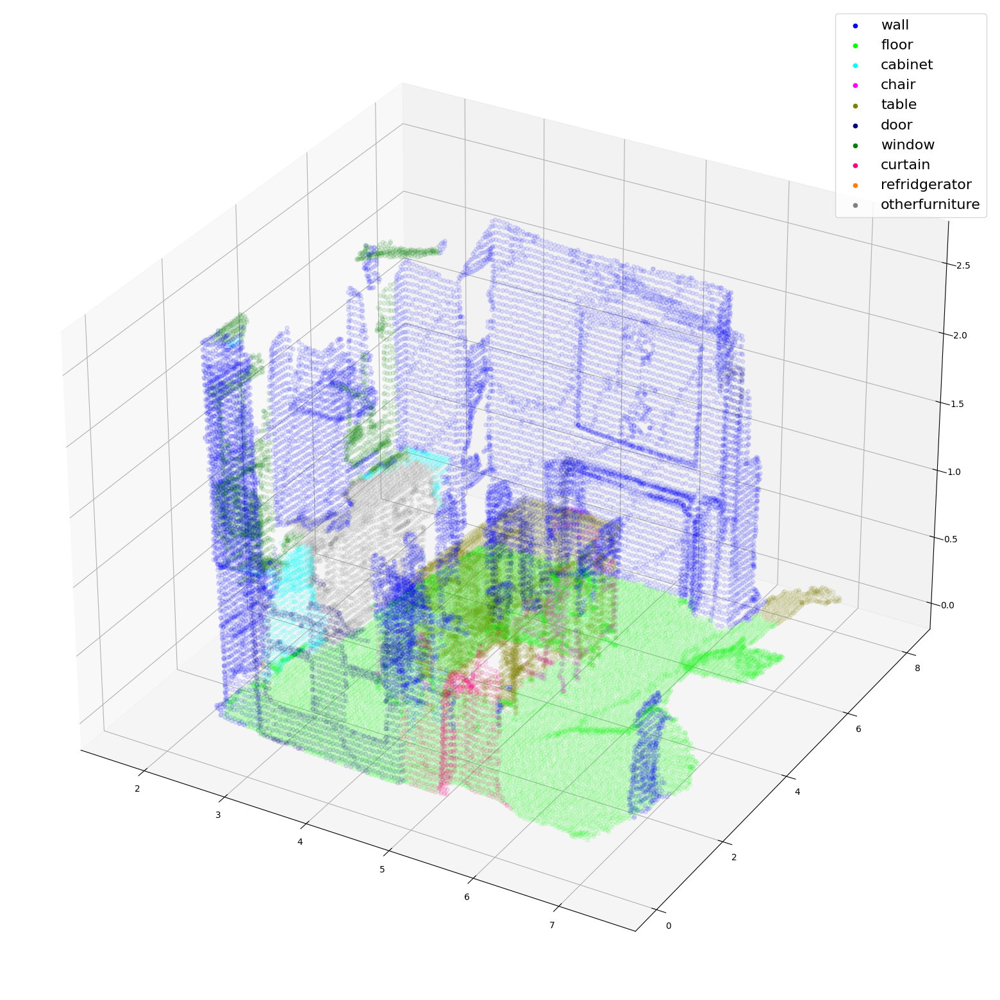

In [10]:
fig = plt.figure(figsize=(20, 20))
ax = fig.add_subplot(111, projection='3d')
for cls in range(21):
    if cls in predictions:
        points_of_class = points_downsampled[predictions == cls]
        ax.scatter(points_of_class[:, 0], points_of_class[:, 1], points_of_class[:, 2], 
                   color=colors[cls], s=20, alpha=0.1, label=class_labels[cls])
leg = ax.legend(fontsize=16)
for lh in leg.legendHandles: 
    lh.set_alpha(1)

In [11]:
import rosbag
import os
import ros_numpy
import numpy as np
from tqdm import tqdm_notebook

In [12]:
data = {
    'points': [],
    'points_downsampled': [],
    'colors_downsampled': [],
    'predictions': [],
    'probabilities': []
}
with rosbag.Bag('habitat_point_clouds.bag', 'r') as bag:
    for topic, msg, t in tqdm_notebook(bag.read_messages()):
        points_numpify = ros_numpy.point_cloud2.pointcloud2_to_array(msg)
        points_numpify = ros_numpy.point_cloud2.split_rgb_field(points_numpify)
        points = np.array([list(x) for x in points_numpify if x[2] < 1.5])
        points_downsampled, colors_downsampled, predictions, probabilities = inference.predict(points)
        data['points'].append(points)
        data['points_downsampled'].append(points_downsampled)
        data['colors_downsampled'].append(colors_downsampled)
        data['predictions'].append(predictions)
        data['probabilities'].append(probabilities)

/tmp/ipykernel_492157/2096188.py:9: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for topic, msg, t in tqdm_notebook(bag.read_messages()):


0it [00:00, ?it/s]

Preprocessing time: 0.00855398178100586
Octree building time: 0.07688784599304199
Inference time: 0.38019609451293945
Preprocessing time: 0.009368658065795898
Octree building time: 0.07817411422729492
Inference time: 0.2630953788757324
Preprocessing time: 0.009758949279785156
Octree building time: 0.1289834976196289
Inference time: 0.2743508815765381
Preprocessing time: 0.01085805892944336
Octree building time: 0.08896780014038086
Inference time: 0.2638113498687744
Preprocessing time: 0.010522603988647461
Octree building time: 0.07569551467895508
Inference time: 0.2639162540435791
Preprocessing time: 0.011257648468017578
Octree building time: 0.09533047676086426
Inference time: 0.2785484790802002
Preprocessing time: 0.011174678802490234
Octree building time: 0.08600282669067383
Inference time: 0.2642374038696289
Preprocessing time: 0.0107879638671875
Octree building time: 0.1096189022064209
Inference time: 0.2641117572784424
Preprocessing time: 0.010435104370117188
Octree building time

KeyboardInterrupt: 

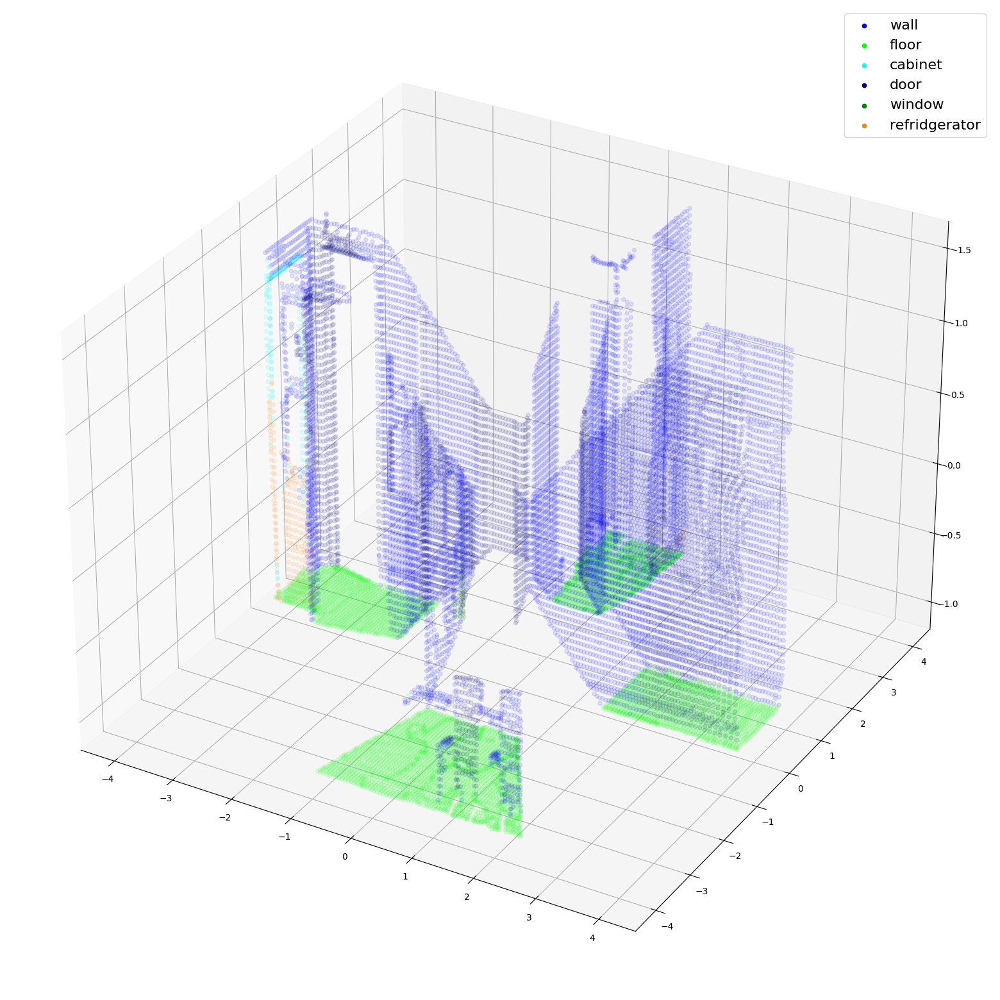

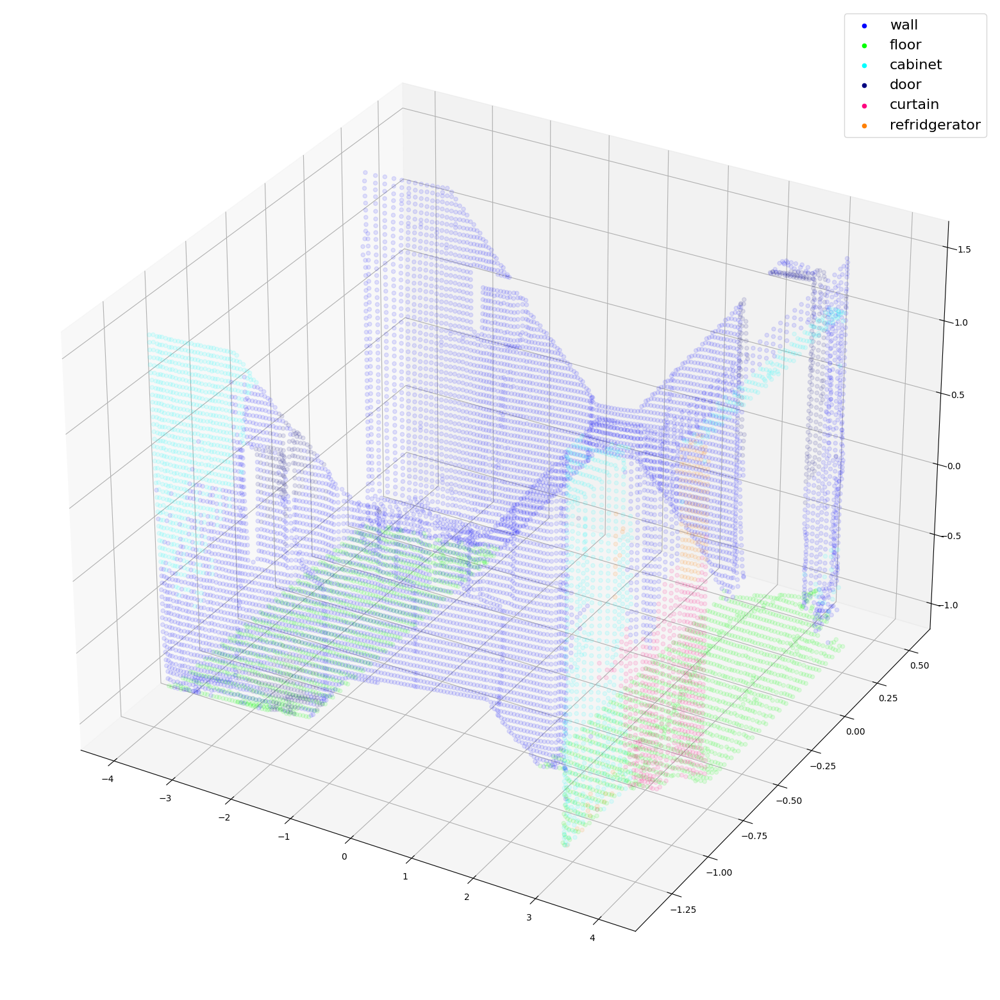

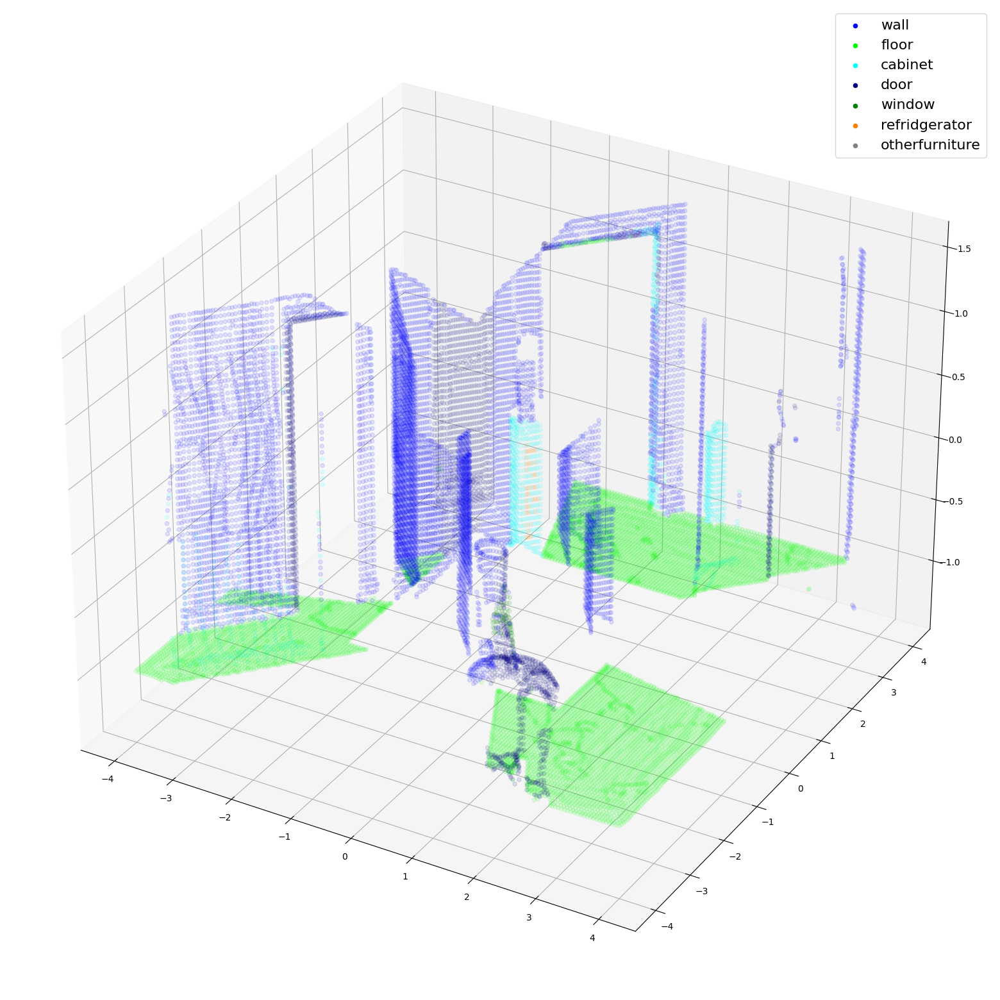

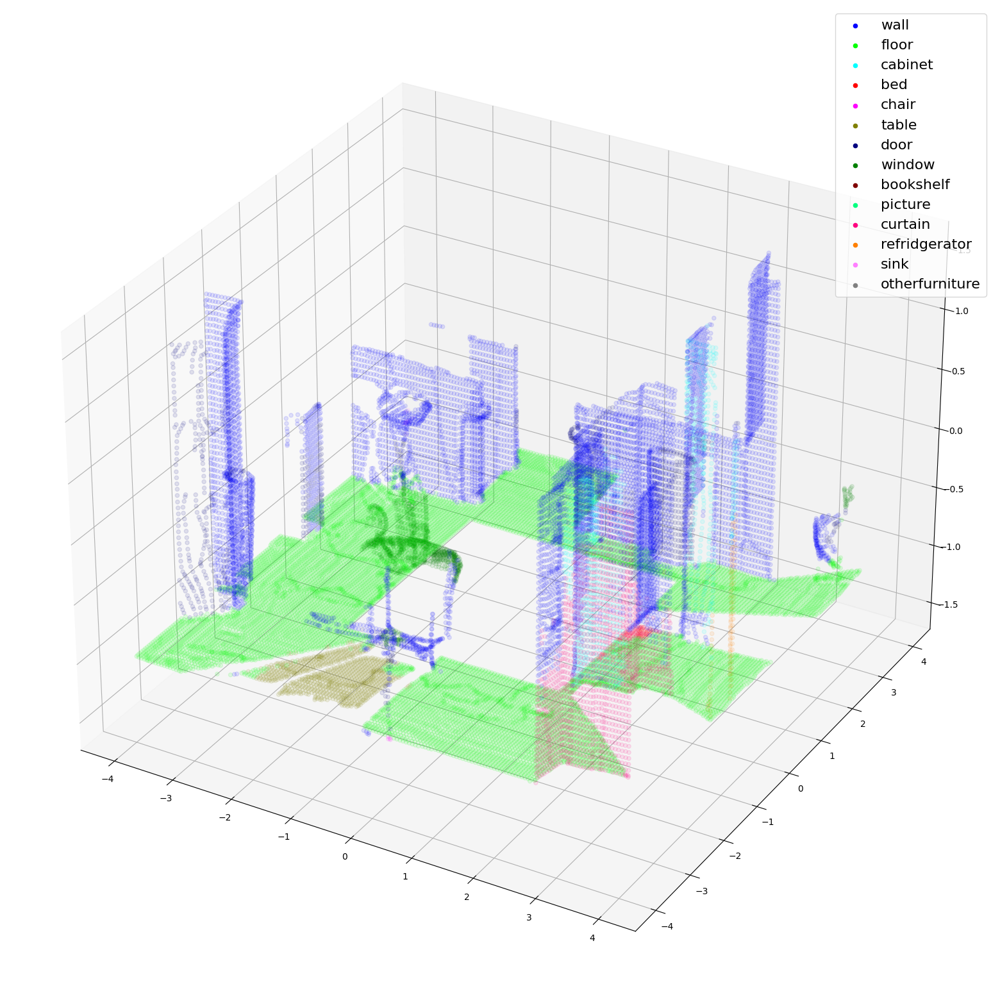

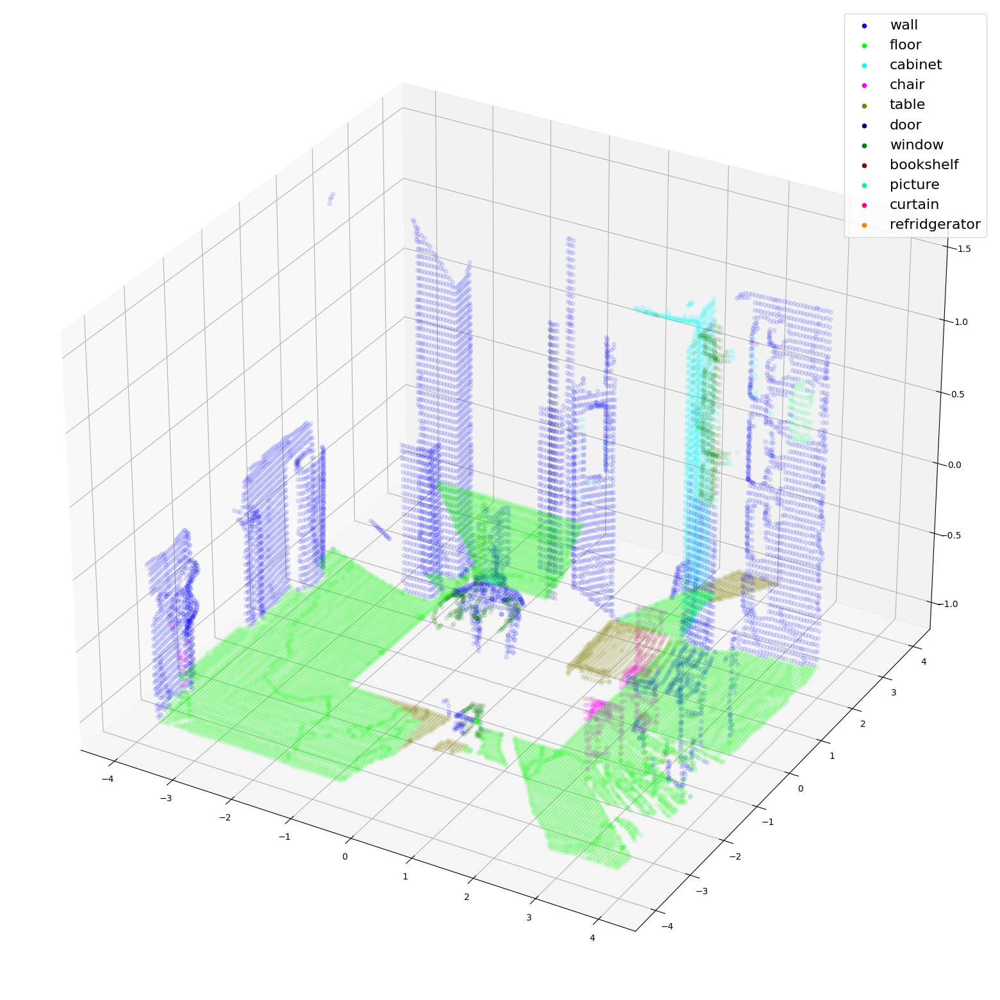

In [23]:
for i in range(0, len(data['predictions']), 100):
    predictions = data['predictions'][i]
    points_downsampled = data['points_downsampled'][i]
    fig = plt.figure(figsize=(20, 20))
    ax = fig.add_subplot(111, projection='3d')
    for cls in range(21):
        if cls in predictions:
            points_of_class = points_downsampled[predictions == cls]
            points_of_class = points_of_class[(np.abs(points_of_class[:, 0]) < 4) * (np.abs(points_of_class[:, 1]) < 4)]
            ax.scatter(points_of_class[:, 0], points_of_class[:, 1], points_of_class[:, 2], 
                       color=colors[cls], s=20, alpha=0.1, label=class_labels[cls])
    leg = ax.legend(fontsize=16)
    for lh in leg.legendHandles: 
        lh.set_alpha(1)
    plt.savefig('segmentation.png')
    plt.show()

## Scan matching with semantic

In [24]:
import torch
from time import time
from utils import transform_pcd
from scipy.spatial.transform import Rotation
from local_grid import LocalGrid
from occupancy_grid import Feature2DGlobalRegistrationPipeline
from semantic_grid_ransac import Feature2DGlobalRegistrationPipeline as Feature2DGlobalRegistrationPipelineSemantic

In [25]:
i = 200
j = 300
ref_cloud = data['points_downsampled'][i]
ref_probs = data['probabilities'][i]
cand_cloud = data['points_downsampled'][j]
cand_probs = data['probabilities'][j]

In [26]:
ref_grid = LocalGrid(semantic_probability_threshold=0.3, floor_height=-0.9, ceil_height=1.5)
ref_grid.update_from_cloud_and_transform(ref_cloud[:, :3], ref_probs)
cand_grid = LocalGrid(semantic_probability_threshold=0.3, floor_height=-0.9, ceil_height=1.5)
cand_grid.update_from_cloud_and_transform(cand_cloud[:, :3], cand_probs)

In [27]:
np.savez('clouds/ref_cloud.npz', ref_cloud[:, :3])
np.savez('clouds/ref_probs.npz', ref_probs)
np.savez('clouds/cand_cloud.npz', cand_cloud[:, :3])
np.savez('clouds/cand_probs.npz', cand_probs)

TypeError: list indices must be integers or slices, not tuple

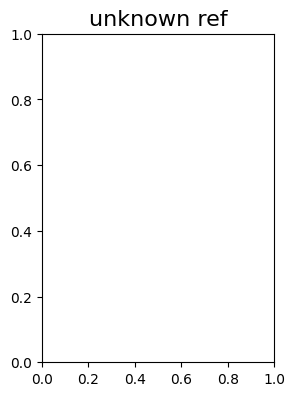

In [28]:
plt.figure(figsize=(21, 35))
for i in range(21):
    plt.subplot(7, 6, i * 2 + 1)
    plt.title(f'{class_labels[i]} ref', fontsize=16)
    img_ref = np.zeros((160, 160, 3), dtype=np.float32)
    img_ref[:, :, 0] = ref_grid.layers['occupancy'][100:260, 100:260]
    img_ref[:, :, 0][img_ref[:, :, 0] == 1] = 0
    img_ref[:, :, 1] = ref_grid.layers['semantic'][100:260, 100:260, i]
    plt.imshow(img_ref)
    plt.subplot(7, 6, i * 2 + 2)
    plt.title(f'{class_labels[i]} cand', fontsize=16)
    img_cand = np.zeros((160, 160, 3), dtype=np.float32)
    img_cand[:, :, 0] = cand_grid.layers['occupancy'][100:260, 100:260]
    img_cand[:, :, 0][img_cand[:, :, 0] == 1] = 0
    img_cand[:, :, 1] = cand_grid.layers['semantic'][100:260, 100:260, i]
    plt.imshow(img_cand)

In [35]:
pipeline = Feature2DGlobalRegistrationPipeline(outlier_thresholds=[2.5, 1.0, 0.5, 0.25, 0.25])
pipeline_semantic = Feature2DGlobalRegistrationPipelineSemantic(outlier_thresholds=[2.5, 1.0, 0.5, 0.25, 0.25],
                                                               ransac_iterations=1000)
ref_grid_tensor = torch.Tensor(ref_grid.layers['occupancy'])
cand_grid_tensor = torch.Tensor(cand_grid.layers['occupancy'])
ref_grid_semantic = ref_grid.layers['semantic']
ref_grid_semantic_tensor = torch.Tensor(ref_grid_semantic)
cand_grid_semantic = cand_grid.layers['semantic']
cand_grid_semantic_tensor = torch.Tensor(cand_grid_semantic)
t1 = time()
transform_semantic, score_semantic = pipeline_semantic.infer(ref_grid_tensor, ref_grid_semantic,
                                  cand_grid_tensor, cand_grid_semantic,
                                  verbose=True)
t2 = time()
print('Matching time:', t2 - t1)
print('Fitness:', score_semantic)
transform, score = pipeline.infer(ref_grid_tensor, cand_grid_tensor, verbose=True)

Image preprocessing time: 0.002092599868774414
Found 500 matches
41 of them are good
Feature matching time: 0.007250785827636719
Number of outliers: 37
Unable to find transform: too few matches!
Outlier removing time: 0.0004019737243652344
Clustering time: 0.015062093734741211
Found 435 pairwise cluster matches
58.388318351829994 64.34003512681758 [[201.16666667 202.5       ]
 [204.4        227.73333333]] [[153.57142857 168.67857143]
 [230.48648649 168.91891892]]
Number of outliers: 41
Unable to find transform: too few matches!
97.51742104424113 102.71508421736644 [[241.14285714 134.85714286]
 [220.58823529 168.64705882]] [[163.24137931 193.51724138]
 [136.44444444 227.55555556]]
Number of outliers: 41
Unable to find transform: too few matches!
92.49906770314801 85.96264046407344 [[247.64705882 186.11764706]
 [204.4        227.73333333]] [[166.85       231.15      ]
 [134.16666667 178.16666667]]
Number of outliers: 39
Unable to find transform: too few matches!
101.65169121333206 97.908

In [31]:
if transform_semantic is None:
    x = 0
    y = 0
    theta = 0
else:
    tf_matrix = ref_grid.get_tf_matrix_xy(*transform_semantic)
    x = tf_matrix[0, 3]
    y = tf_matrix[1, 3]
    _, __, theta = Rotation.from_matrix(tf_matrix[:3, :3]).as_rotvec()

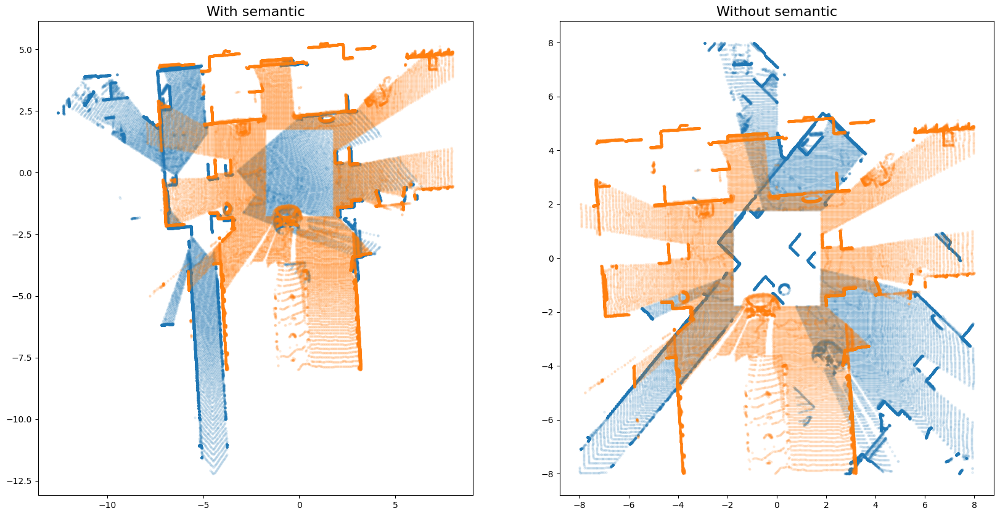

In [36]:
plt.figure(figsize=(20, 10))
plt.subplot(1, 2, 1)
plt.title('With semantic', fontsize=16)
ref_cloud_transformed = transform_pcd(ref_cloud, x, y, -theta)
plt.scatter(ref_cloud_transformed[:, 0], ref_cloud_transformed[:, 1], s=5, alpha=0.1)
plt.scatter(cand_cloud[:, 0], cand_cloud[:, 1], s=5, alpha=0.1)
plt.subplot(1, 2, 2)
plt.title('Without semantic', fontsize=16)
plt.scatter(ref_cloud[:, 0], ref_cloud[:, 1], s=5, alpha=0.1)
plt.scatter(cand_cloud[:, 0], cand_cloud[:, 1], s=5, alpha=0.1)
plt.savefig('matching_comparison.png')

## Estimate precision and recall of scan matching

In [ ]:
def get_tf_matrix(transform_for_grid):
        trans_i, trans_j, rot_angle = transform_for_grid
        #print('Trans i trans j rot angle:', trans_i, trans_j, rot_angle)
        plus8 = np.eye(4)
        max_range = 18
        grid_size = 0.1
        plus8[0, 3] = max_range# + 1
        plus8[1, 3] = max_range# + 1
        minus8 = np.eye(4)
        minus8[0, 3] = -max_range# - 1
        minus8[1, 3] = -max_range# - 1
        tf_matrix = np.array([
            [np.cos(rot_angle), np.sin(rot_angle), 0, trans_i * grid_size],
            [-np.sin(rot_angle), np.cos(rot_angle), 0, trans_j * grid_size],
            [0,                  0,                 1, 0],
            [0,                  0,                 0, 1]
        ])
        tf_matrix = minus8 @ tf_matrix @ plus8
        #print('Translation from tf matrix:', tf_matrix[:, 3])
        return tf_matrix

In [ ]:
def normalize(angle):
    while angle > np.pi:
        angle -= 2 * np.pi
    while angle < -np.pi:
        angle += 2 * np.pi
    return angle

def transformation_error(gt_pose_shift, tf_matrix_estimated):
    tf_rotation = Rotation.from_matrix(tf_matrix_estimated[:3, :3]).as_rotvec()
    gt_x, gt_y, gt_angle = gt_pose_shift
    #gt_angle = -gt_angle
    estimated_angle = tf_rotation[2]
    estimated_x = tf_matrix_estimated[0, 3]
    estimated_y = tf_matrix_estimated[1, 3]
    return (np.abs(estimated_x - gt_x), np.abs(estimated_y - gt_y), np.abs(normalize(estimated_angle - gt_angle)))

In [ ]:
pipeline_semantic = Feature2DGlobalRegistrationPipelineSemantic(outlier_thresholds=[2.5, 1.0, 0.5, 0.25, 0.25],
                                                               ransac_iterations=1000)
pipeline = Feature2DGlobalRegistrationPipeline(outlier_thresholds=[2.5, 1.0, 0.5, 0.25, 0.25])

In [ ]:
from utils import transform_pcd, get_rel_pose, get_occupancy_grid, apply_pose_shift
from utils import get_iou as get_iou_of_grids

In [ ]:
def get_iou(rel_x, rel_y, rel_theta, cur_cloud, v_cloud):
    cur_grid = get_occupancy_grid(cur_cloud)
    v_grid = get_occupancy_grid(v_cloud)
    try:
        return get_iou_of_grids(rel_x, rel_y, rel_theta, cur_grid, v_grid)
    except:
        return np.zeros((360, 360)), 0

In [ ]:
pr_data_dir = '/data/test_mssplace_by_odometry_8/place_recognition_data'
graph_data_dir = '/data/test_mssplace_by_odometry_8/graph_data'
runtimes = []
runtimes_orb = []
semantic_results = []
orb_results = []
ious = []
for ii, test_name in tqdm_notebook(enumerate(os.listdir(pr_data_dir))):
    test_dir = os.path.join(pr_data_dir, test_name)
    try:
        transforms_ = np.loadtxt(os.path.join(test_dir, 'transforms.txt'))
    except FileNotFoundError:
        continue
    if transforms_.ndim == 1:
        transforms_ = transforms_[np.newaxis, :]
    if transforms_.size == 0:
        continue
    cand_clouds = {}
    cand_poses = {}
    cand_probs = {}
    for idx in transforms_[:, 0]:
        cloud = np.load(os.path.join(graph_data_dir, str(int(idx)), 'points_downsampled.npz'))['arr_0']
        pose_stamped = np.loadtxt(os.path.join(graph_data_dir, str(int(idx)), 'pose_stamped.txt'))
        probs = np.load(os.path.join(graph_data_dir, str(int(idx)), 'probabilities.npz'))['arr_0']
        cand_clouds[int(idx)] = cloud
        cand_poses[int(idx)] = pose_stamped[1:]
        cand_probs[int(idx)] = probs
    ref_cloud = np.load(os.path.join(test_dir, 'points_downsampled.npz'))['arr_0']
    ref_cloud = ref_cloud[:, :3]
    ref_cloud = ref_cloud[ref_cloud == ref_cloud].reshape((-1, 3))
    ref_probs = np.load(os.path.join(test_dir, 'probabilities.npz'))['arr_0']
    ref_grid = LocalGrid(semantic_probability_threshold=0.3, floor_height=-0.9, ceil_height=1.5)
    ref_grid.update_from_cloud_and_transform(ref_cloud, ref_probs)
    ref_grid_tensor = torch.Tensor(ref_grid.layers['occupancy'])
    ref_grid_semantic = ref_grid.layers['semantic']
    gt_poses = np.loadtxt(os.path.join(test_dir, 'gt_poses.txt'))
    transforms = {}
    pr_scores = np.loadtxt(os.path.join(test_dir, 'pr_scores.txt'))
    reg_scores = np.loadtxt(os.path.join(test_dir, 'reg_scores.txt'))
    if reg_scores.ndim == 0:
        reg_scores = np.array([reg_scores])
    for i in range(transforms_.size // 7):
        idx = transforms_[i, 0]
        pr_score = pr_scores[i]
        reg_score = reg_scores[i]
        transforms[idx] = transforms_[i, 1:]
        gt_pose = cand_poses[int(idx)]
        pose_shift = get_rel_pose(*gt_poses[0], *gt_pose)
        dist = np.sqrt(pose_shift[0] ** 2 + pose_shift[1] ** 2)
        cloud = cand_clouds[int(idx)][:, :3]
        cloud = cloud[cloud == cloud].reshape((-1, 3))
        cand_grid = LocalGrid(semantic_probability_threshold=0.3, floor_height=-0.9, ceil_height=1.5)
        probs = cand_probs[int(idx)]
        cand_grid.update_from_cloud_and_transform(cloud[:, :3], probs)
        cand_grid_tensor = torch.Tensor(cand_grid.layers['occupancy'])
        cand_grid_semantic = cand_grid.layers['semantic']
        # SEMANTIC METHOD
        start_time = time()
        transform_semantic, score_semantic = pipeline_semantic.infer(ref_grid_tensor, ref_grid_semantic,
                                  cand_grid_tensor, cand_grid_semantic,
                                  verbose=False)
        runtimes.append(time() - start_time)
        grid_aligned, iou = get_iou(*pose_shift, ref_cloud, cloud)
        ious.append(iou)
        # print('SEMANTIC:', transform_semantic, score_semantic)
        if transform_semantic is not None:
            tf_matrix_semantic = ref_grid.get_tf_matrix_xy(*transform_semantic)#get_tf_matrix(transform_semantic)
            # fitness_sift, ref_wall_mask, ref_floor_mask, cand_wall_mask, cand_floor_mask = fitness_sift_with_masks
            error_semantic = transformation_error(pose_shift, np.linalg.inv(tf_matrix_semantic))
            # print('Error semantic:', error_semantic)
        else:
            error_semantic = (np.inf, np.inf, np.inf)
            score_semantic = 0
        semantic_results.append((score_semantic, error_semantic))
        # OLD METHOD
        start_time = time()
        transform_orb, score_orb = pipeline.infer(ref_grid_tensor, cand_grid_tensor, verbose=False)
        # print('OLD:', transform_orb, score_orb)
        runtimes_orb.append(time() - start_time)
        if transform_orb is not None:
            tf_matrix_orb = ref_grid.get_tf_matrix_xy(*transform_orb)#get_tf_matrix(transform_semantic)
            # fitness_sift, ref_wall_mask, ref_floor_mask, cand_wall_mask, cand_floor_mask = fitness_sift_with_masks
            error_orb = transformation_error(pose_shift, np.linalg.inv(tf_matrix_orb))
            # print('Error orb:', error_orb)
        else:
            error_orb = (np.inf, np.inf, np.inf)
            score_orb = 0
        orb_results.append((score_orb, error_orb))

In [ ]:
np.mean(runtimes)

In [ ]:
threshold = 0.7
n_correct_matches = np.sum([(fitness > threshold) * (max(error) < 0.5) \
                                              for fitness, error in orb_results])
print('Number of correct matches:', n_correct_matches)
n_wrong_matches = np.sum([(fitness > threshold) * (max(error) > 0.5) \
                                              for fitness, error in orb_results])
print('Number of wrong matches:', n_wrong_matches)
n_missed_05 = np.sum([(orb_results[i][0] < threshold) * (ious[i] > 0.5) \
                                                          for i in range(len(ious))])
print('Number of missed matches with IoU > 0.5:', n_missed_05)
n_missed_025 = np.sum([(orb_results[i][0] < threshold) * (ious[i] > 0.25) \
                                                          for i in range(len(ious))])
print('Number of missed matches with IoU > 0.25:', n_missed_025)

In [ ]:
print('Precision:', n_correct_matches / (n_correct_matches + n_wrong_matches))
print('Recall@0.5:', 1 - n_missed_05 / (np.array(ious) > 0.5).sum())
print('Recall@0.25:', 1 - n_missed_025 / (np.array(ious) > 0.25).sum())

In [ ]:
threshold = 0.7
n_correct_matches = np.sum([(fitness > threshold) * (max(error) < 0.5) \
                                              for fitness, error in semantic_results])
print('Number of correct matches:', n_correct_matches)
n_wrong_matches = np.sum([(fitness > threshold) * (max(error) > 0.5) \
                                              for fitness, error in semantic_results])
print('Number of wrong matches:', n_wrong_matches)
n_missed_05 = np.sum([(semantic_results[i][0] < threshold) * (ious[i] > 0.5) \
                                                          for i in range(len(ious))])
print('Number of missed matches with IoU > 0.5:', n_missed_05)
n_missed_025 = np.sum([(semantic_results[i][0] < threshold) * (ious[i] > 0.25) \
                                                          for i in range(len(ious))])
print('Number of missed matches with IoU > 0.25:', n_missed_025)

In [ ]:
print('Precision:', n_correct_matches / (n_correct_matches + n_wrong_matches))
print('Recall@0.5:', 1 - n_missed_05 / (np.array(ious) > 0.5).sum())
print('Recall@0.25:', 1 - n_missed_025 / (np.array(ious) > 0.25).sum())

In [ ]:
(np.array(ious) > 0.25).mean()